In [1]:
import sys
import os
from transformers import CLIPTokenizer
from diffusers import LMSDiscreteScheduler
import numpy as np
from PIL import Image
from controlnet_aux import OpenposeDetector
import openvino as ov

c:\Users\chuxd\miniconda3\envs\ov_sd_controlnet\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\chuxd\miniconda3\envs\ov_sd_controlnet\Lib\site-packages\controlnet_aux\mediapipe_face\mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
c:\Users\chuxd\miniconda3\envs\ov_sd_controlnet\Lib\site-packages\controlnet_aux\segment_anything\modeling\tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
c:\Users\chuxd\minicon

In [2]:
module_path = os.path.abspath(os.path.join('../detectors/scripts'))
if module_path not in sys.path:
    sys.path.append(module_path)
from ov_pipelines import OpenPoseOVModel, OVContrlNetStableDiffusionPipeline

## utils

We define two functions to run the Stable Diffusion ControlNet pipeline in both Python and C++ using the same settings.

In [3]:
ov_pipe = None
pose_estimator = None
def run_python_pipeline(prompt, negative_prompt, seed, steps, model_path, device, input_image, output_image):
    global ov_pipe
    global pose_estimator
    if ov_pipe is None and pose_estimator is None:
        pose_estimator = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
        OPENPOSE_OV_PATH = os.path.join(model_path, "openpose.xml")
        CONTROLNET_OV_PATH = os.path.join(model_path, "controlnet-pose.xml")
        UNET_OV_PATH = os.path.join(model_path, "unet_controlnet.xml")
        TEXT_ENCODER_OV_PATH = os.path.join(model_path, "text_encoder.xml")
        VAE_DECODER_OV_PATH = os.path.join(model_path, "vae_decoder.xml")

        core = ov.Core()
        ov_openpose = OpenPoseOVModel(core, OPENPOSE_OV_PATH, device=device)
        pose_estimator.body_estimation.model = ov_openpose

        tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")

        scheduler_config = {"num_train_timesteps": 1000, "beta_start": 0.00085, "beta_end": 0.012, "beta_schedule": "scaled_linear", "prediction_type": "epsilon"}
        scheduler = LMSDiscreteScheduler.from_config(scheduler_config)
        ov_pipe = OVContrlNetStableDiffusionPipeline(
            tokenizer,
            scheduler,
            core,
            CONTROLNET_OV_PATH,
            TEXT_ENCODER_OV_PATH,
            UNET_OV_PATH,
            VAE_DECODER_OV_PATH,
            device=device,
        )


    img = Image.open(input_image)

    np.random.seed(seed)

    pose = pose_estimator(img)

    result = ov_pipe(prompt, pose, steps, negative_prompt=negative_prompt)

    res = result[0]
    res.save(output_image)
    print("timesteps: ", ov_pipe.scheduler.timesteps)

def run_cpp_pipeline(prompt, negative_prompt, seed, steps, model_path, device, input_image, output_image, latent_path, controlnet_input_path):
    import subprocess
    # copy openvino dlls and opencv dlls and tbb12 dlls to ../build/Release/
    # or make sure they're in path
    command = [
        "../build/Release/stable_diffusion_controlnet.exe", 
        "-p", prompt,
        "-n", negative_prompt,
        "-i", input_image, 
        "-o", output_image, 
        "-m" ,model_path, 
        "-s", str(seed), 
        "--step", str(steps),
        "-d", device, 
        "-l", latent_path,
        "-c",
        ]
    if controlnet_input_path is not None:
        command.extend(["-x", controlnet_input_path])
    result = subprocess.run(command, capture_output=True, text=True, cwd=".")
    print(f"stdout: {result.stdout}")
    print(f"stderr: {result.stderr}")

## inference

Here, we use 10 different seeds to run the process and choose the dGPU (which can be modified to use different devices).

In [4]:
prompt = "Dancing Darth Vader, best quality, extremely detailed"
negative_prompt = "monochrome, lowres, bad anatomy, worst quality, low quality"
input_image = "pose.png"
steps = 20

# differencet seeds will causing different lantent
seeds = [40 + x for x in range(10)]
model_path = os.path.abspath(os.path.join('../models'))
device = "GPU.1"

latent, latent_with_sigma, init_noise_sigma = None, None, None
for seed in seeds:
    output_image = os.path.join('./images', f"output_{seed}_py.png")
    run_python_pipeline(prompt, negative_prompt, seed, steps, model_path, device, input_image, output_image)
    latent, latent_with_sigma, init_noise_sigma = ov_pipe.init_latent, ov_pipe.init_latent_sigma, ov_pipe.init_noise_sigma
    controlnet_input = ov_pipe.controlnet_input
    latent_path = os.path.join('./images', f"latent_{seed}.txt")
    latent_sigma_path = os.path.join('./images', f"latent_{seed}.sigma.txt")
    init_noise_sigma_path = os.path.join('./images', f"sigma_{seed}.txt")
    controlnet_input_path = os.path.join('./images', f"controlnet_input_{seed}.txt")
    np.savetxt(latent_path, latent, fmt='%.8e')
    np.savetxt(controlnet_input_path, controlnet_input.flatten(), fmt='%.8e')
    # np.savetxt(latent_sigma_path, latent_with_sigma.flatten(), fmt='%.8e')
    # print(init_noise_sigma)

c:\Users\chuxd\miniconda3\envs\ov_sd_controlnet\Lib\site-packages\huggingface_hub\file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
c:\Users\chuxd\miniconda3\envs\ov_sd_controlnet\Lib\site-packages\diffusers\configuration_utils.py:139: FutureWarning: Accessing config attribute `unet` directly via 'OVContrlNetStableDiffusionPipeline' object attribute is deprecated. Please access 'unet' over 'OVContrlNetStableDiffusionPipeline's config object instead, e.g. 'scheduler.config.unet'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)


14.614646911621094


  0%|          | 0/20 [00:00<?, ?it/s]c:\Users\chuxd\miniconda3\envs\ov_sd_controlnet\Lib\site-packages\diffusers\configuration_utils.py:139: FutureWarning: Accessing config attribute `controlnet` directly via 'OVContrlNetStableDiffusionPipeline' object attribute is deprecated. Please access 'controlnet' over 'OVContrlNetStableDiffusionPipeline's config object instead, e.g. 'scheduler.config.controlnet'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)
100%|██████████| 20/20 [00:04<00:00,  4.08it/s]


timesteps:  tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000])
14.614646911621094


100%|██████████| 20/20 [00:05<00:00,  3.99it/s]


timesteps:  tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000])
14.614646911621094


100%|██████████| 20/20 [00:04<00:00,  4.10it/s]


timesteps:  tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000])
14.614646911621094


100%|██████████| 20/20 [00:04<00:00,  4.09it/s]


timesteps:  tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000])
14.614646911621094


100%|██████████| 20/20 [00:04<00:00,  4.02it/s]


timesteps:  tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000])
14.614646911621094


100%|██████████| 20/20 [00:04<00:00,  4.00it/s]


timesteps:  tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000])
14.614646911621094


100%|██████████| 20/20 [00:04<00:00,  4.05it/s]


timesteps:  tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000])
14.614646911621094


100%|██████████| 20/20 [00:04<00:00,  4.02it/s]


timesteps:  tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000])
14.614646911621094


100%|██████████| 20/20 [00:04<00:00,  4.11it/s]


timesteps:  tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000])
14.614646911621094


100%|██████████| 20/20 [00:04<00:00,  4.14it/s]


timesteps:  tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000])


## run in cpp

Using the same latent as in Python, we run the pipeline in C++.

In [5]:
for seed in seeds:
    # run cpp pipeline
    output_image = os.path.join('./images', f"output_{seed}_cpp.bmp")
    latent_path = os.path.join('./images', f"latent_{seed}.txt")
    run_cpp_pipeline(
        prompt, negative_prompt, seed, steps, model_path, device, input_image,output_image,latent_path, None
    )

stdout: OpenVINO version: OpenVINO Runtime
    Version : 2024.2.0
    Build   : 2024.2.0-15519-5c0f38f83f6-releases/2024/2

Loading and compiling text encoder: 2539.85 ms
Loading and compiling UNet: 9204.96 ms
Loading and compiling Detector: Loading model from: c:\Users\chuxd\repos\openvino.genai\image_generation\stable_diffusion_1_5_controlnet\cpp\models/openpose.xml
349.315 ms
Loading and compiling Controlnet: 3964.26 ms
Loading and compiling VAE decoder: 1363 ms
Loading and compiling tokenizer: 87.8092 ms
Running Stable Diffusion pipeline: Running inference
image_width: 512, image_height768
pad_width: 171, pad_height0
timesteps: 
999 946 894 841 789 736 684 631 578 526 473 421 368 315 263 210 158 105 53 0 
running 1/20
running 2/20
running 3/20
running 4/20
running 5/20
running 6/20
running 7/20
running 8/20
running 9/20
running 10/20
running 11/20
running 12/20
running 13/20
running 14/20
running 15/20
running 16/20
running 17/20
running 18/20
running 19/20
running 20/20
8302.88 ms

## difference

We define a diff function to visualize the differences in the results.

In [6]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def diff_image(image1, image2):
    img1 = np.array(image1).astype(float)
    img2 = np.array(image2).astype(float)
    
    diff = np.abs(img1 - img2)
    
    # average difference per channel
    channel_diffs = np.mean(diff, axis=(0, 1))
    
    # normalize difference
    normalized_diff = diff / np.max(diff)
    
    # total difference
    total_diff = np.mean(normalized_diff, axis=2)
    
    return channel_diffs, total_diff

## Results

The results are not 100% identical, but all of them show that ControlNet is taking effect.

The differences may stem from some preprocessing or postprocessing logic in the detectors or controlnet.

Additionally, when I was debugging I saw from the logs that the scheduler's sigmas are not identical between Python and C++. This is very likely to affect the final results, too.

Therefore, let's skip the detector and preprocessing part of controlnet, use the same tensor that was used on the Python side, and run the process again to check the final results. This way, any differences should only come from the scheduler.

In [8]:
for seed in seeds:
    # run cpp pipeline
    output_image = os.path.join('./images', f"output_{seed}_cpp_nodetector.bmp")
    latent_path = os.path.join('./images', f"latent_{seed}.txt")
    controlnet_input_path = os.path.join('./images', f"controlnet_input_{seed}.txt")
    run_cpp_pipeline(
        prompt, negative_prompt, seed, steps, model_path, device, input_image,output_image,latent_path, controlnet_input_path
    )

stdout: OpenVINO version: OpenVINO Runtime
    Version : 2024.2.0
    Build   : 2024.2.0-15519-5c0f38f83f6-releases/2024/2

Loading and compiling text encoder: 3034.17 ms
Loading and compiling UNet: 9655.28 ms
Loading and compiling Detector: Loading model from: c:\Users\chuxd\repos\openvino.genai\image_generation\stable_diffusion_1_5_controlnet\cpp\models/openpose.xml
319.431 ms
Loading and compiling Controlnet: 4653.01 ms
Loading and compiling VAE decoder: 1266.13 ms
Loading and compiling tokenizer: 43.8577 ms
Running Stable Diffusion pipeline: Running inference
image_width: 512, image_height768
pad_width: 171, pad_height0
timesteps: 
999 946 894 841 789 736 684 631 578 526 473 421 368 315 263 210 158 105 53 0 
running 1/20
running 2/20
running 3/20
running 4/20
running 5/20
running 6/20
running 7/20
running 8/20
running 9/20
running 10/20
running 11/20
running 12/20
running 13/20
running 14/20
running 15/20
running 16/20
running 17/20
running 18/20
running 19/20
running 20/20
9414.3 

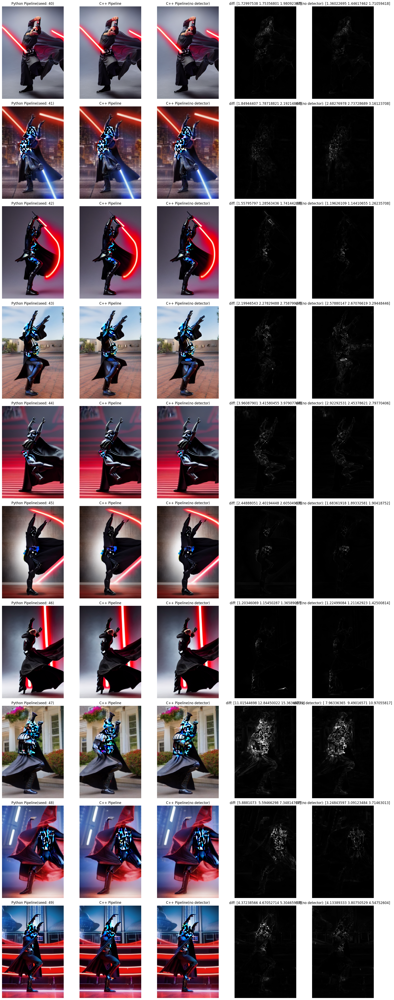

In [14]:
def display_images_no_detector(seeds):
    import matplotlib.pyplot as plt
    from PIL import Image

    num_images = len(seeds)
    fig, axes = plt.subplots(num_images, 5, figsize=(20, 5 * num_images))

    for i, data in enumerate(seeds):
        seed = seeds[i]
        output_image_cpp0 = Image.open(os.path.join('./images', f"output_{seed}_cpp.bmp"))
        output_image_cpp = Image.open(os.path.join('./images', f"output_{seed}_cpp_nodetector.bmp"))
        output_image_py = Image.open(os.path.join('./images', f"output_{seed}_py.png"))
        channel_diffs0, total_diff0 = diff_image(output_image_cpp0, output_image_py)
        channel_diffs, total_diff = diff_image(output_image_cpp, output_image_py)
        latent_path = os.path.join('./images', f"latent_{seed}.txt")

        if num_images == 1:
            ax = axes
        else:
            ax = axes[i]
        
        # Display original image
        ax[0].imshow(output_image_py)
        ax[0].set_title(f"Python Pipeline(seed: {seed})")
        ax[0].axis('off')
        
        # Display C++ result image
        ax[1].imshow(output_image_cpp0)
        ax[1].set_title(f"C++ Pipeline")
        ax[1].axis('off')

        # Display C++ result with no detector and preprocessing
        ax[2].imshow(output_image_cpp)
        ax[2].set_title(f"C++ Pipeline(no detector)")
        ax[2].axis('off')
        
        # Display diff
        ax[3].imshow(total_diff0, cmap='gray')
        ax[3].set_title(f"diff: {channel_diffs0}")
        ax[3].axis('off')
        
        # Display diff
        ax[4].imshow(total_diff, cmap='gray')
        ax[4].set_title(f"diff(no detector): {channel_diffs}")
        ax[4].axis('off')

    plt.tight_layout()
    plt.savefig("results.png")
    plt.show()

display_images_no_detector(seeds)

## summary

To sum it up, our results are not exactly the same as the Python implementation. The differences are caused by the following factors:

1. Preprocessing and postprocessing logic in the detectors: For more details, we could check the `detectors/scripts/verify.ipynb` notebook.
2. Preprocessing logic in ControlNet: The resize function is most likely not identical to the one used in Python (in C++, I am using OpenCV's Lanczos, while Python uses PIL's Lanczos).
3. The scheduler itself: It is not 100% identical to the Python version.


These precision differences may affect the final results. However, from a human perspective, the quality appears to be at the same level (we cannot distinguish between the Python and C++ versions without specifying). The ControlNet and detectors are definitely functioning as expected.